# Transfer Learning
### Two methods to do transfer learning


* **Freeze the weights of the pre-trained layers and add some new layers and
just train them**


* **Take the weights of pre-trained layer as the starting weights and train the entire network.** *Resnet 50 architecture is trained similarly. ResNet-50 is trained on Imagenet with image size of 224,224,3 while CIFAR data set has image size 32,32,3 so an UpSampling layer is used*













In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf

In [ ]:
tf.__version__

'2.4.0'

In [ ]:
import urllib.request
import os
import zipfile
data_url = "https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip"
data_file_name = "catsdogs.zip"
download_dir = '/tmp/'
urllib.request.urlretrieve(data_url, data_file_name)
zip_ref = zipfile.ZipFile(data_file_name, 'r')
zip_ref.extractall(download_dir)
zip_ref.close()

In [ ]:
print("Number of cat images:",len(os.listdir('/tmp/PetImages/Cat/')))
print("Number of dog images:", len(os.listdir('/tmp/PetImages/Dog/')))

Number of cat images: 12501
Number of dog images: 12501


In [ ]:
try:
    os.mkdir('/tmp/cats-v-dogs')
    os.mkdir('/tmp/cats-v-dogs/training')
    os.mkdir('/tmp/cats-v-dogs/testing')
    os.mkdir('/tmp/cats-v-dogs/training/cats')
    os.mkdir('/tmp/cats-v-dogs/training/dogs')
    os.mkdir('/tmp/cats-v-dogs/testing/cats')
    os.mkdir('/tmp/cats-v-dogs/testing/dogs')
except OSError:
    pass

In [ ]:
import random
from shutil import copyfile
def split_data(SOURCE, TRAINING, TESTING, SPLIT_SIZE):
    files = []
    for filename in os.listdir(SOURCE):
        file = SOURCE + filename
        if os.path.getsize(file) > 0:
            files.append(filename)
        else:
            print(filename + " is zero length, so ignoring.")

    training_length = int(len(files) * SPLIT_SIZE)
    testing_length = int(len(files) - training_length)
    shuffled_set = random.sample(files, len(files))
    training_set = shuffled_set[0:training_length]
    testing_set = shuffled_set[:testing_length]

    for filename in training_set:
        this_file = SOURCE + filename
        destination = TRAINING + filename
        copyfile(this_file, destination)

    for filename in testing_set:
        this_file = SOURCE + filename
        destination = TESTING + filename
        copyfile(this_file, destination)


CAT_SOURCE_DIR = "/tmp/PetImages/Cat/"
TRAINING_CATS_DIR = "/tmp/cats-v-dogs/training/cats/"
TESTING_CATS_DIR = "/tmp/cats-v-dogs/testing/cats/"
DOG_SOURCE_DIR = "/tmp/PetImages/Dog/"
TRAINING_DOGS_DIR = "/tmp/cats-v-dogs/training/dogs/"
TESTING_DOGS_DIR = "/tmp/cats-v-dogs/testing/dogs/"

split_size = .9
split_data(CAT_SOURCE_DIR, TRAINING_CATS_DIR, TESTING_CATS_DIR, split_size)
split_data(DOG_SOURCE_DIR, TRAINING_DOGS_DIR, TESTING_DOGS_DIR, split_size)


666.jpg is zero length, so ignoring.
11702.jpg is zero length, so ignoring.


In [ ]:
print("Number of training cat images", len(os.listdir('/tmp/cats-v-dogs/training/cats/')))
print("Number of training dog images", len(os.listdir('/tmp/cats-v-dogs/training/dogs/')))
print("Number of testing cat images", len(os.listdir('/tmp/cats-v-dogs/testing/cats/')))
print("Number of testing dog images", len(os.listdir('/tmp/cats-v-dogs/testing/dogs/')))


Number of training cat images 11250
Number of training dog images 11250
Number of testing cat images 1250
Number of testing dog images 1250


In [ ]:
TRAINING_DIR = "/tmp/cats-v-dogs/training/"
# Experiment with your own parameters to reach 99.9% validation accuracy or better
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')
train_generator = train_datagen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=100,
                                                    class_mode='binary',
                                                    target_size=(150, 150))

VALIDATION_DIR = "/tmp/cats-v-dogs/testing/"

validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                              batch_size=100,
                                                              class_mode='binary',
                                                              target_size=(150, 150))


Found 22498 images belonging to 2 classes.
Found 2500 images belonging to 2 classes.


In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

weights_url = "https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5"
weights_file = "inception_v3.h5"
urllib.request.urlretrieve(weights_url, weights_file)

# Instantiate the model
pre_trained_model = InceptionV3(input_shape=(150, 150, 3),
                                include_top=False,
                                weights=None)

In [ ]:
# load pre-trained weights
pre_trained_model.load_weights(weights_file)

# freeze the layers
for layer in pre_trained_model.layers:
    layer.trainable = False

In [ ]:
# from tensorflow.python.keras.utils.vis_utils import plot_model
# plot_model(pre_trained_model, show_shapes=True, show_layer_names=True, to_file='model.png')

In [ ]:
# check the trainable parameters in the summary
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 74, 74, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 74, 74, 32)   0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [ ]:
last_layer = pre_trained_model.get_layer('mixed10')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 3, 3, 2048)


In [ ]:
from tensorflow.keras import Model
# Flatten the output layer to 1 dimension
x = tf.keras.layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = tf.keras.layers.Dense(1024, activation='relu')(x)
# Add a final sigmoid layer for classification
x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = Model(pre_trained_model.input, x)

In [ ]:
from tensorflow.keras.optimizers import RMSprop
# compile the model
model.compile(optimizer=RMSprop(lr=0.0001),
              loss='binary_crossentropy',
              metrics=['acc'])

# train the model (adjust the number of epochs from 1 to improve performance)
history = model.fit(
            train_generator,
            validation_data=validation_generator,
            epochs=2,
            verbose=1)

Epoch 1/2
  5/225 [..............................] - ETA: 2:04 - loss: 8.8716 - acc: 0.5450

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 32 bytes but only got 0. Skipping tag 270
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 5 bytes but only got 0. Skipping tag 271
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 272
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 282
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only

225/225 [==============================] - 187s 795ms/step - loss: 1.2478 - acc: 0.8576 - val_loss: 0.2115 - val_acc: 0.9204
Epoch 2/2
225/225 [==============================] - 168s 745ms/step - loss: 0.2101 - acc: 0.9127 - val_loss: 0.0719 - val_acc: 0.9680


<Figure size 432x288 with 0 Axes>

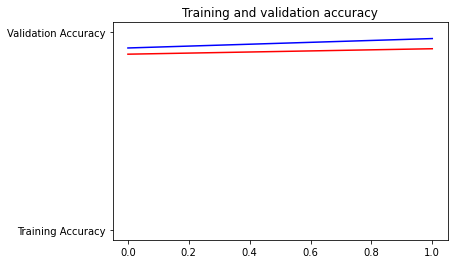

<Figure size 432x288 with 0 Axes>

In [ ]:
#Validate and predict

%matplotlib inline

import matplotlib.image  as mpimg
import matplotlib.pyplot as plt

#-----------------------------------------------------------
# Retrieve a list of list results on training and test data
# sets for each training epoch
#-----------------------------------------------------------
acc=history.history['acc']
val_acc=history.history['val_acc']
loss=history.history['loss']
val_loss=history.history['val_loss']

epochs=range(len(acc)) # Get number of epochs

#------------------------------------------------
# Plot training and validation accuracy per epoch
#------------------------------------------------
plt.plot(epochs, acc, 'r', "Training Accuracy")
plt.plot(epochs, val_acc, 'b', "Validation Accuracy")
plt.title('Training and validation accuracy')
plt.figure()


In [ ]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(150, 150))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  image_tensor = np.vstack([x])
  classes = model.predict(image_tensor)
  print(classes)
  print(classes[0])
  if classes[0]>0.5:
    print(fn + " is a dog")
  else:
    print(fn + " is a cat")

Saving dog_img.png to dog_img.png
[[0.9570622]]
[0.9570622]
dog_img.png is a dog


# Transfer learning with RESNET-50

In [ ]:
%reset -f
import numpy as np
import tensorflow as tf

In [ ]:
# loading CIFAR-10 data from keras dataset
(training_images, training_labels) , (validation_images, validation_labels) = tf.keras.datasets.cifar10.load_data()
print(training_images.shape)
print(training_labels.shape)
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

(50000, 32, 32, 3)
(50000, 1)


airplane


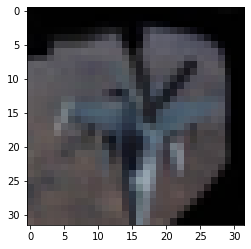

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.imshow(training_images[179:180,:].reshape(32,32,3))
print(classes[int(training_labels[179:180,:].reshape(1))])

In [ ]:
train_X, valid_X = training_images/255.0 , validation_images/255.0

airplane


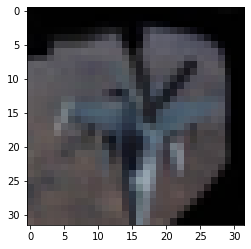

In [ ]:
plt.imshow(train_X[179:180,:].reshape(32,32,3))
print(classes[int(training_labels[179:180,:].reshape(1))])

94773248/94765736 [==============================] - 0s 0us/step


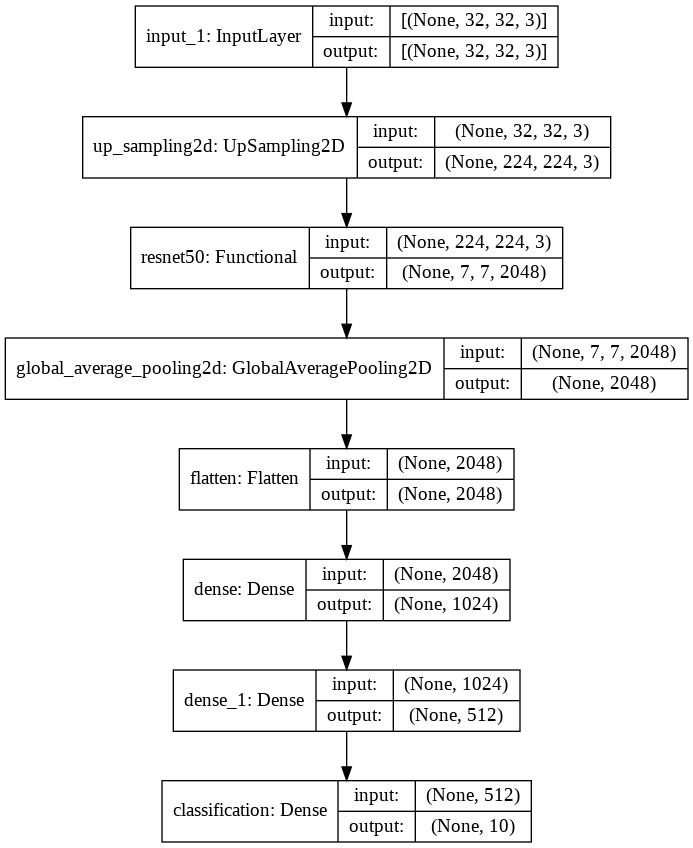

In [ ]:
'''
Feature Extraction is performed by ResNet50 pretrained on imagenet weights. 
Input size is 224 x 224.
'''
inputs = tf.keras.layers.Input(shape=(32,32,3))
'''
Since input image size is (32 x 32), first upsample the image by factor of (7x7) to transform it to (224 x 224)
Connect the feature extraction and "classifier" layers to build the model.
'''
resize = tf.keras.layers.UpSampling2D(size=(7,7))(inputs)

feature_extractor = tf.keras.applications.resnet.ResNet50(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights='imagenet')(resize)

x = tf.keras.layers.GlobalAveragePooling2D()(feature_extractor)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation="relu")(x)
x = tf.keras.layers.Dense(512, activation="relu")(x)
outputs = tf.keras.layers.Dense(10, activation="softmax", name="classification")(x)

model = tf.keras.Model(inputs=inputs, outputs = outputs)

from tensorflow.python.keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, to_file='model.png')

In [ ]:
model.compile(optimizer='SGD', 
                loss='sparse_categorical_crossentropy',
                metrics = ['accuracy'])

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 1024)              2098176   
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800

In [ ]:
EPOCHS = 4
history = model.fit(train_X, training_labels, epochs=EPOCHS, validation_data = (valid_X, validation_labels), batch_size=64)

Epoch 1/4
782/782 [==============================] - 273s 338ms/step - loss: 0.8299 - accuracy: 0.7291 - val_loss: 1.2122 - val_accuracy: 0.5893
Epoch 2/4
782/782 [==============================] - 263s 337ms/step - loss: 0.1274 - accuracy: 0.9581 - val_loss: 0.2139 - val_accuracy: 0.9289
Epoch 3/4
782/782 [==============================] - 263s 337ms/step - loss: 0.0462 - accuracy: 0.9857 - val_loss: 0.2175 - val_accuracy: 0.9348
Epoch 4/4
782/782 [==============================] - 263s 337ms/step - loss: 0.0185 - accuracy: 0.9955 - val_loss: 0.1877 - val_accuracy: 0.9488


In [ ]:
'''
Make trainable features=False for the feature extractor layer and try
'''

# Object Localizattion on Synthetic MNIST dataset
##### Evaluation metric for object detection requires another metric to evaluate how precise bounding boxes were predicted for that we use **IOU**


*   IOU Values ranges from 0 and 1



In [32]:
%reset -f
import numpy as np
import tensorflow as tf


In [33]:
data = tf.keras.datasets.fashion_mnist
(training_images, training_labels), (test_images, test_labels) = data.load_data()

training_images  = training_images / 255.0
test_images = test_images / 255.0

4423680/4422102 [==============================] - 0s 0us/step


In [34]:
def read_image_tfds(image, label):
    xmin = tf.random.uniform((), 0 , 48, dtype=tf.int32)
    ymin = tf.random.uniform((), 0 , 48, dtype=tf.int32)
    image = tf.reshape(image, (28,28,1,))
    image = tf.image.pad_to_bounding_box(image, ymin, xmin, 75, 75)
    image = tf.cast(image, tf.float32)/255.0
    xmin = tf.cast(xmin, tf.float32)
    ymin = tf.cast(ymin, tf.float32)
   
    xmax = (xmin + 28) / 75
    ymax = (ymin + 28) / 75
    xmin = xmin / 75
    ymin = ymin / 75
    return image, (tf.one_hot(label, 10), [xmin, ymin, xmax, ymax])

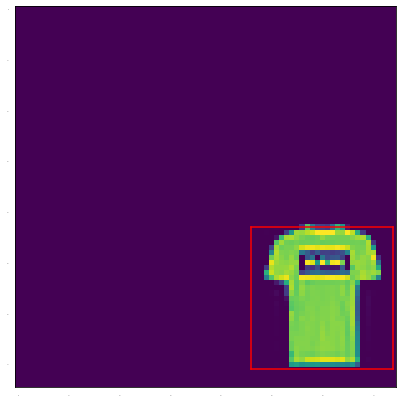

In [36]:
import matplotlib.pyplot as plt
image_x, label = read_image_tfds(training_images[1:2,:],9)
image = image_x.numpy().reshape(75,75)
plt.imshow(image)
'''Plot the bounding box'''
xmin, ymin, xmax, ymax = np.array(label[1])*75
plt.plot([xmin,xmax],[ymax,ymax],'r-')
plt.plot([xmin,xmax],[ymin,ymin],'r-')
plt.plot([xmin,xmin],[ymin,ymax],'r-')
plt.plot([xmax,xmax],[ymin,ymax],'r-')



In [ ]:
# create the model
inputs = tf.keras.layers.Input(shape=(75, 75, 1,))
## Feature extractor
x = tf.keras.layers.Conv2D(16, activation='relu', kernel_size=3, input_shape=(75, 75, 1))(inputs)
x = tf.keras.layers.AveragePooling2D((2, 2))(x)

x = tf.keras.layers.Conv2D(32,kernel_size=3,activation='relu')(x)
x = tf.keras.layers.AveragePooling2D((2, 2))(x)

x = tf.keras.layers.Conv2D(64,kernel_size=3,activation='relu')(x)
f_cnn = tf.keras.layers.AveragePooling2D((2, 2))(x)

x = tf.keras.layers.Flatten()(f_cnn)
dense = tf.keras.layers.Dense(128, activation='relu')(x)

classification_output = tf.keras.layers.Dense(10, activation='softmax', name = 'classification')(dense)

bounding_box_output = tf.keras.layers.Dense(units = '4', name = 'bounding_box')(dense)

model = tf.keras.Model(inputs = inputs, outputs = [classification_output, bounding_box_output])



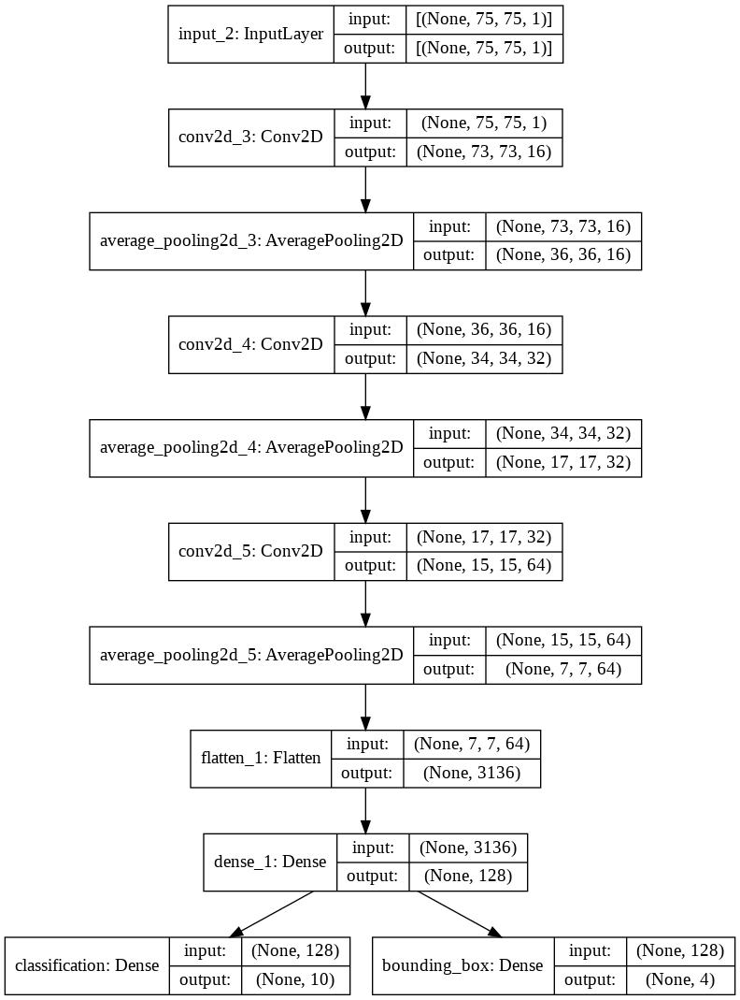

In [ ]:
from tensorflow.python.keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, to_file='model.png')

In [ ]:
model.compile(optimizer='adam', 
              loss = {'classification' : 'categorical_crossentropy',
                      'bounding_box' : 'mse'
                     },
              metrics = {'classification' : 'accuracy',
                         'bounding_box' : 'mse'
                        })

In [ ]:
EPOCHS = 45
BATCH_SIZE = 64
steps_per_epoch = 60000//BATCH_SIZE  # 60,000 items in this dataset
validation_steps = 1

import tensorflow_datasets as tfds
dataset = tfds.load("mnist", split="train", as_supervised=True)
# training_dataset = dataset.map(read_image_tfds,num_parallel_calls=16).shuffle(5000, reshuffle_each_iteration=True).repeat().batch(BATCH_SIZE,drop_remainder=True).prefetch(-1)
training_dataset = dataset.map(read_image_tfds).repeat().batch(BATCH_SIZE,drop_remainder=True).prefetch(-1)

dataset = tfds.load("mnist", split="test", as_supervised=True)
# validation_dataset = dataset.map(read_image_tfds,num_parallel_calls=16).shuffle(5000, reshuffle_each_iteration=True).repeat().batch(BATCH_SIZE,drop_remainder=True).prefetch(-1)
validation_dataset = dataset.map(read_image_tfds).repeat().batch(BATCH_SIZE,drop_remainder=True).prefetch(-1)

In [ ]:
history = model.fit(training_dataset,
                    steps_per_epoch=steps_per_epoch, 
                    validation_data=validation_dataset, 
                    validation_steps=validation_steps, 
                    epochs=EPOCHS
                    )

Epoch 1/45
937/937 [==============================] - 17s 17ms/step - loss: 1.6351 - classification_loss: 1.6135 - bounding_box_loss: 0.0216 - classification_accuracy: 0.3979 - bounding_box_mse: 0.0216 - val_loss: 0.3825 - val_classification_loss: 0.3712 - val_bounding_box_loss: 0.0113 - val_classification_accuracy: 0.8750 - val_bounding_box_mse: 0.0113
Epoch 2/45
937/937 [==============================] - 13s 13ms/step - loss: 0.2977 - classification_loss: 0.2899 - bounding_box_loss: 0.0078 - classification_accuracy: 0.9111 - bounding_box_mse: 0.0078 - val_loss: 0.2831 - val_classification_loss: 0.2781 - val_bounding_box_loss: 0.0050 - val_classification_accuracy: 0.9219 - val_bounding_box_mse: 0.0050
Epoch 3/45
937/937 [==============================] - 13s 14ms/step - loss: 0.2115 - classification_loss: 0.2070 - bounding_box_loss: 0.0045 - classification_accuracy: 0.9387 - bounding_box_mse: 0.0045 - val_loss: 0.2114 - val_classification_loss: 0.2076 - val_bounding_box_loss: 0.0038 -

In [ ]:
loss, classification_loss, bounding_box_loss, classification_accuracy, bounding_box_mse = model.evaluate(validation_dataset, 
                                                                                                         steps=1)
print("Validation accuracy: ", classification_accuracy)

1/1 [==============================] - 0s 99ms/step - loss: 0.0208 - classification_loss: 0.0200 - bounding_box_loss: 8.1073e-04 - classification_accuracy: 1.0000 - bounding_box_mse: 8.1073e-04
Validation accuracy:  1.0


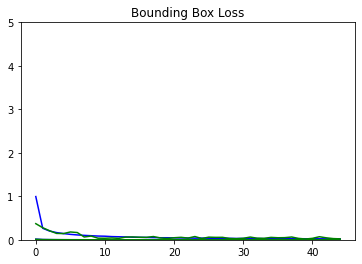

In [ ]:
# utility to display training and validation curves
import matplotlib.pyplot as plt
def plot_metrics(metric_name, title, ylim=5):
  plt.title(title)
  plt.ylim(0,ylim)
  plt.plot(history.history[metric_name],color='blue',label=metric_name)
  plt.plot(history.history['val_' + metric_name],color='green',label='val_' + metric_name)

plot_metrics("classification_loss", "Classification Loss")
plot_metrics("bounding_box_loss", "Bounding Box Loss")

In [ ]:
def intersection_over_union(pred_box, true_box):
    xmin_pred, ymin_pred, xmax_pred, ymax_pred =  np.split(pred_box, 4, axis = 1)
    xmin_true, ymin_true, xmax_true, ymax_true = np.split(true_box, 4, axis = 1)


    xmin_overlap = np.maximum(xmin_pred, xmin_true)
    xmax_overlap = np.minimum(xmax_pred, xmax_true)
    ymin_overlap = np.maximum(xmin_pred, xmin_true)
    ymax_overlap = np.minimum(ymax_pred, ymax_true)

    pred_box_area = (xmax_pred - xmin_pred + 1) * (ymax_pred - ymin_pred + 1)
    true_box_area = (xmax_true - xmin_true + 1) * (ymax_true - ymin_true + 1)

    overlap_area = np.maximum((xmax_overlap - xmin_overlap) + 1,0)  * np.maximum((ymax_overlap - ymin_overlap) + 1, 0)
    union_area = (pred_box_area + true_box_area) - overlap_area

    iou = overlap_area / union_area

    return iou

In [ ]:
validation_digits = validation_dataset.unbatch().batch(64)

print(validation_dataset)
print(validation_digits)

for image,pred in validation_digits:
  # print(image.numpy().reshape(75,75,1))
  img = image.numpy()
  cls,bbox = pred[0].numpy(),pred[1].numpy()
  # print(cls)
  # print(bbox)
  break

<PrefetchDataset shapes: ((64, 75, 75, 1), ((64, 10), (64, 4))), types: (tf.float32, (tf.float32, tf.float32))>
<BatchDataset shapes: ((None, 75, 75, 1), ((None, 10), (None, 4))), types: (tf.float32, (tf.float32, tf.float32))>


In [ ]:

# recognize validation digits

validation_digits = validation_dataset

predictions = model.predict(validation_digits, batch_size=64,steps=1)
predicted_labels = np.argmax(predictions[0], axis=1)

predicted_bboxes = predictions[1]

iou = intersection_over_union(predicted_bboxes, bbox)

iou_threshold = 0.6

print("Number of predictions where iou > threshold(%s): %s" % (iou_threshold, (iou >= iou_threshold).sum()))
print("Number of predictions where iou < threshold(%s): %s" % (iou_threshold, (iou < iou_threshold).sum()))

Number of predictions where iou > threshold(0.6): 22
Number of predictions where iou < threshold(0.6): 42


[0.5466667  0.45333335 0.92       0.82666665]
[0.39162368 0.46973503 0.7649566  0.843059  ]


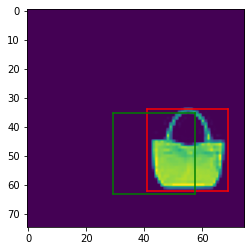

[0.52       0.18666667 0.8933333  0.56      ]
[0.39162368 0.46973503 0.7649566  0.843059  ]


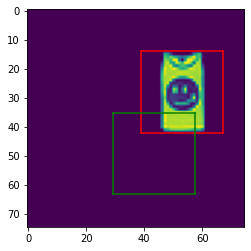

[0.46666667 0.29333332 0.84       0.6666667 ]
[0.39162368 0.46973503 0.7649566  0.843059  ]


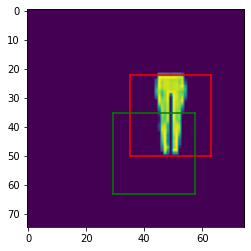

[0.34666666 0.48       0.72       0.85333335]
[0.39162368 0.46973503 0.7649566  0.843059  ]


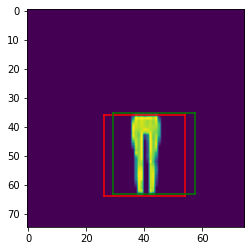

[0.5466667  0.16       0.92       0.53333336]
[0.39162368 0.46973503 0.7649566  0.843059  ]


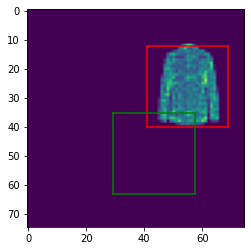

[0.58666664 0.12       0.96       0.49333334]
[0.39162368 0.46973503 0.7649566  0.843059  ]


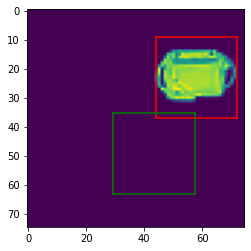

[0.32       0.37333333 0.6933333  0.74666667]
[0.39162368 0.46973503 0.7649566  0.843059  ]


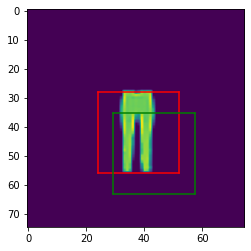

[0.28      0.2       0.6533333 0.5733333]
[0.39162368 0.46973503 0.7649566  0.843059  ]


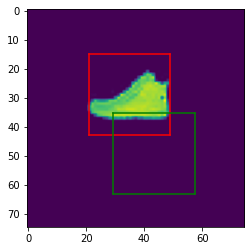

[0.37333333 0.44       0.74666667 0.81333333]
[0.39162368 0.46973503 0.7649566  0.843059  ]


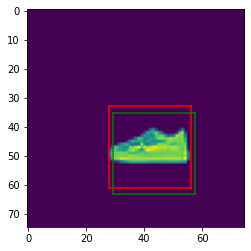

[0.50666666 0.26666668 0.88       0.64      ]
[0.39162368 0.46973503 0.7649566  0.843059  ]


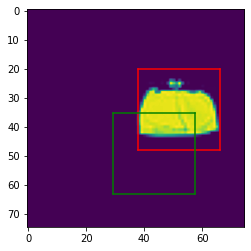

In [ ]:
for img_num in range(100,110):
  image_x, label = read_image_tfds(training_images[img_num:img_num+1,:],9)
  image = image_x.numpy().reshape(75,75)
  label1 = model.predict(image_x.numpy().reshape(1,75,75))
  
  plt.imshow(image)
  '''Plot the bounding box'''
  xmin, ymin, xmax, ymax = np.array(label[1])*75
  plt.plot([xmin,xmax],[ymax,ymax],'r-')
  plt.plot([xmin,xmax],[ymin,ymin],'r-')
  plt.plot([xmin,xmin],[ymin,ymax],'r-')
  plt.plot([xmax,xmax],[ymin,ymax],'r-')
  print(np.array(label[1]))


  
  print(label1[1][0])
  pxmin, pymin, pxmax, pymax = np.array(label1[1][0])*75
  plt.plot([pxmin,pxmax],[pymax,pymax],'g-')
  plt.plot([pxmin,pxmax],[pymin,pymin],'g-')
  plt.plot([pxmin,pxmin],[pymin,pymax],'g-')
  plt.plot([pxmax,pxmax],[pymin,pymax],'g-')
  plt.show()

In [ ]:
# utility to display a row of digits with their predictions
def display_digits_with_boxes(digits, predictions, labels, pred_bboxes, bboxes, iou, title):

  n = 10

  indexes = np.random.choice(len(predictions), size=n)
  n_digits = digits[indexes]
  n_predictions = predictions[indexes]
  n_labels = labels[indexes]

  n_iou = []
  if len(iou) > 0:
    n_iou = iou[indexes]

  if (len(pred_bboxes) > 0):
    n_pred_bboxes = pred_bboxes[indexes,:]

  if (len(bboxes) > 0):
    n_bboxes = bboxes[indexes,:]


  n_digits = n_digits * 255.0
  n_digits = n_digits.reshape(n, 75, 75)
  fig = plt.figure(figsize=(20, 4))
  plt.title(title)
  plt.yticks([])
  plt.xticks([])
  
  for i in range(10):
    ax = fig.add_subplot(1, 10, i+1)
    bboxes_to_plot = []
    if (len(pred_bboxes) > i):
      bboxes_to_plot.append(n_pred_bboxes[i])
    
    if (len(bboxes) > i):
      bboxes_to_plot.append(n_bboxes[i])

    img_to_draw = draw_bounding_boxes_on_image_array(image=n_digits[i], boxes=np.asarray(bboxes_to_plot), color=['red', 'green'], display_str_list=["true", "pred"])
    plt.xlabel(n_predictions[i])
    plt.xticks([])
    plt.yticks([])
    
    if n_predictions[i] != n_labels[i]:
      ax.xaxis.label.set_color('red')

    
    
    plt.imshow(img_to_draw)

    if len(iou) > i :
      color = "black"
      if (n_iou[i][0] < iou_threshold):
        color = "red"
      ax.text(0.2, -0.3, "iou: %s" %(n_iou[i][0]), color=color, transform=ax.transAxes)

In [ ]:
display_digits_with_boxes(validation_digits, predicted_labels, cls, predicted_bboxes, bbox, iou, "True and Predicted values")

TypeError: ignored

In [ ]:
for img1,label in training_dataset.unbatch().take(10):
  image = img1.numpy().reshape(75,75)
  label1 = model.predict(image_x.numpy().reshape(1,75,75))
  print(label1[1][0], label[1].numpy())
  if (intersection_over_union(label1[1][0].reshape(4,), label[1].numpy().reshape(4,1))>0.6):
    plt.imshow(image)
    '''Plot the bounding box'''
    xmin, ymin, xmax, ymax = np.array(label[1])*75
    plt.plot([xmin,xmax],[ymax,ymax],'r-')
    plt.plot([xmin,xmax],[ymin,ymin],'r-')
    plt.plot([xmin,xmin],[ymin,ymax],'r-')
    plt.plot([xmax,xmax],[ymin,ymax],'r-')
    print(np.array(label[1])*75)


    
    print(label1[1][0]*75)
    pxmin, pymin, pxmax, pymax = np.array(label1[1][0])*75
    plt.plot([pxmin,pxmax],[pymax,pymax],'g-')
    plt.plot([pxmin,pxmax],[pymin,pymin],'g-')
    plt.plot([pxmin,pxmin],[pymin,pymax],'g-')
    plt.plot([pxmax,pxmax],[pymin,pymax],'g-')
    plt.show()

[0.39162368 0.46973503 0.7649566  0.843059  ] [0.38666666 0.34666666 0.76       0.72      ]


IndexError: ignored

# Object Detection : Loading model from Tensorflow Hub

In [ ]:
%reset -f
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
%pwd

'/content/drive/My Drive'

In [ ]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
ImageColor.colormap.values()

dict_values(['#f0f8ff', '#faebd7', '#00ffff', '#7fffd4', '#f0ffff', '#f5f5dc', '#ffe4c4', (0, 0, 0), '#ffebcd', '#0000ff', '#8a2be2', '#a52a2a', '#deb887', '#5f9ea0', '#7fff00', '#d2691e', '#ff7f50', '#6495ed', '#fff8dc', '#dc143c', '#00ffff', '#00008b', '#008b8b', '#b8860b', '#a9a9a9', '#a9a9a9', '#006400', '#bdb76b', '#8b008b', '#556b2f', '#ff8c00', '#9932cc', '#8b0000', '#e9967a', '#8fbc8f', '#483d8b', '#2f4f4f', '#2f4f4f', '#00ced1', '#9400d3', '#ff1493', '#00bfff', '#696969', '#696969', '#1e90ff', '#b22222', '#fffaf0', '#228b22', '#ff00ff', '#dcdcdc', '#f8f8ff', '#ffd700', '#daa520', '#808080', '#808080', '#008000', '#adff2f', '#f0fff0', '#ff69b4', '#cd5c5c', '#4b0082', '#fffff0', '#f0e68c', '#e6e6fa', '#fff0f5', '#7cfc00', '#fffacd', '#add8e6', '#f08080', '#e0ffff', '#fafad2', '#90ee90', '#d3d3d3', '#d3d3d3', '#ffb6c1', '#ffa07a', '#20b2aa', '#87cefa', '#778899', '#778899', '#b0c4de', '#ffffe0', '#00ff00', '#32cd32', '#faf0e6', '#ff00ff', '#800000', '#66cdaa', '#0000cd', '#ba55d3

In [ ]:
def display_image(image):
    """
    Displays an image inside the notebook.
    This is used by download_and_resize_image()
    """
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)

def load_img(path):
    '''
    Loads a JPEG image and converts it to a tensor.
    
    Args:
        path (string) -- path to a locally saved JPEG image
    
    Returns:
        (tensor) -- an image tensor
    '''
    
    # read the file
    img = tf.io.read_file(path)
    
    # convert to a tensor
    img = tf.image.decode_jpeg(img, channels=3)
    
    return img

import time
def run_detector(detector, path):
    '''
    Runs inference on a local file using an object detection model.
    
    Args:
        detector (model) -- an object detection model loaded from TF Hub
        path (string) -- path to an image saved locally
    '''
    
    # load an image tensor from a local file path
    img = load_img(path)

    # add a batch dimension in front of the tensor
    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    
    # run inference using the model
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    # save the results in a dictionary
    result = {key:value.numpy() for key,value in result.items()}

    # print results
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

    # draw predicted boxes over the image
    image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])
    
    # display the image
    display_image(image_with_boxes)

    # print(result["detection_scores"])
    # print(result["detection_class_entities"])
    # print(result["detection_boxes"])




def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=6,
                               display_str_list=()):

    """
    Adds a bounding box to an image.
    
    Args:
        image -- the image object
        ymin -- bounding box coordinate
        xmin -- bounding box coordinate
        ymax -- bounding box coordinate
        xmax -- bounding box coordinate
        color -- color for the bounding box edges
        font -- font for class label
        thickness -- edge thickness of the bounding box
        display_str_list -- class labels for each object detected
    
    
    Returns:
        No return.  The function modifies the `image` argument 
                    that gets passed into this function
    
    """
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    
    # scale the bounding box coordinates to the height and width of the image
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
    
    # define the four edges of the detection box
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

    # If the total height of the display strings added to the top of the bounding
    # box exceeds the top of the image, stack the strings below the bounding box
    # instead of above.
    display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
    # Each display_str has a top and bottom margin of 0.05x.
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height
        
    # Reverse list and print from bottom to top.
    for display_str in display_str_list[::-1]:
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                        (left + text_width, text_bottom)],
                       fill=color)
        draw.text((left + margin, text_bottom - text_height - margin),
                  display_str,
                  fill="black",
                  font=font)
        text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    """
    Overlay labeled boxes on an image with formatted scores and label names.
    
    Args:
        image -- the image as a numpy array
        boxes -- list of detection boxes
        class_names -- list of classes for each detected object
        scores -- numbers showing the model's confidence in detecting that object
        max_boxes -- maximum detection boxes to overlay on the image (default is 10)
        min_score -- minimum score required to display a bounding box
    
    Returns:
        image -- the image after detection boxes and classes are overlaid on the original image.
    """
    # colors = list(ImageColor.colormap.values())
    colors = ['#008000']

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    for i in range(min(boxes.shape[0], max_boxes)):
        
        # only display detection boxes that have the minimum score or higher
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                         int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")

            # draw one bounding box and overlay the class labels onto the image
            draw_bounding_box_on_image(image_pil,
                                       ymin,
                                       xmin,
                                       ymax,
                                       xmax,
                                       color,
                                       font,
                                       display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
        
    return image

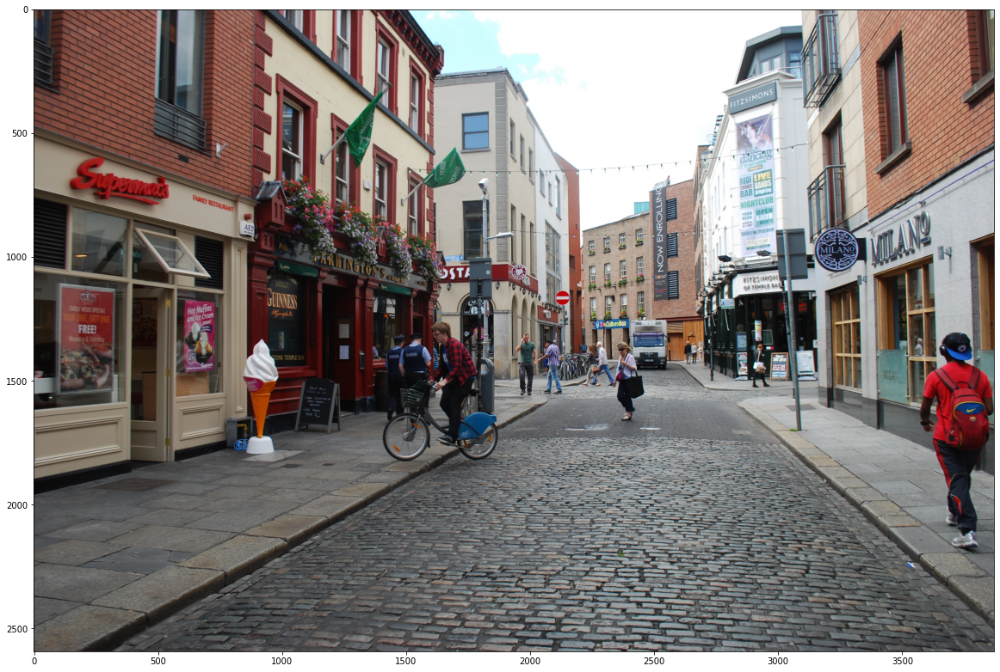

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

image_path = "DL/Comp_Vision/prac/20130807_dublin014.JPG"
pil_image = Image.open(image_path)
display_image(pil_image)

Found 100 objects.
Inference time:  0.8830306529998779


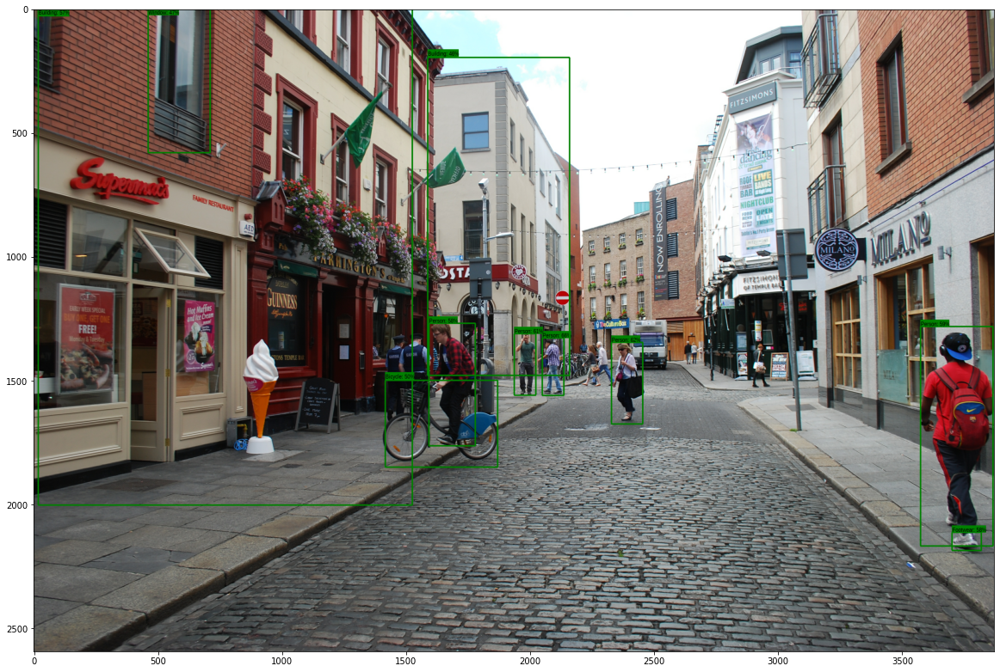

In [ ]:
# runs the object detection model and prints information about the objects found
run_detector(detector, image_path)

# Object detection : cloning the tensorflow models and using utilities

In [1]:
%reset -f
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)

import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models


2.4.0
Cloning into 'models'...
remote: Enumerating objects: 2363, done.
remote: Counting objects: 100% (2363/2363), done.
remote: Compressing objects: 100% (2059/2059), done.
remote: Total 2363 (delta 579), reused 949 (delta 278), pack-reused 0
Receiving objects: 100% (2363/2363), 30.68 MiB | 4.31 MiB/s, done.
Resolving deltas: 100% (579/579), done.


In [2]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1606870 sha256=26ddfbdd878b57f247620ed01dc87fdebe7b8c3b9110aacea82c59ce3316e9d6
  Stored in directory: /tmp/pip-ephem-wheel-cache-7pj79tal/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
  Created wheel for avro-python3: filename=avro_python3-1.10.1-cp36-none-any.whl size=43734 sha256=41b3619754442c0943ba396bc35f239aa00e83cd346ef232cf582426de092bc0
  Stored in directory: /root/.cache/pip/wheels/65/fe/90/20d6d6d97223d80d20cb390be636619c536edab5658c12bdba
  Created wheel for dill: filename=dill-0.3.1.1-cp36-none-any.whl size=78533 sha256=d69dd13b30e7f57f4cc7503cf6c39177e9810ad4387cb41a73ad39c83cc6ec1b
  Stored in directory: /root/.cache/pip/wheels/59/b1/91/f02e76c732915c4015ab4010f3015469866c1eb9b14058d8e7
  Created wheel for hdfs: filename=hdfs-2.5.8-cp36-none-any.whl size=33213 sha256=a6fdaea8250516874abb3f50524f0fc854c52924d8b34300e834bb0842

ERROR: multiprocess 0.70.11.1 has requirement dill>=0.3.3, but you'll have dill 0.3.1.1 which is incompatible.
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.25.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: apache-beam 2.26.0 has requirement avro-python3!=1.9.2,<1.10.0,>=1.8.1, but you'll have avro-python3 1.10.1 which is incompatible.


In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline

In [ ]:
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

#### Below handle or any other object detection URI can be fetched from the [link](https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/tf2_object_detection.ipynb) 

In [ ]:
print('loading model...')

# hub_model = hub.load("https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1")
hub_model = hub.load("https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1")
print('model loaded!')

loading model...
model loaded!


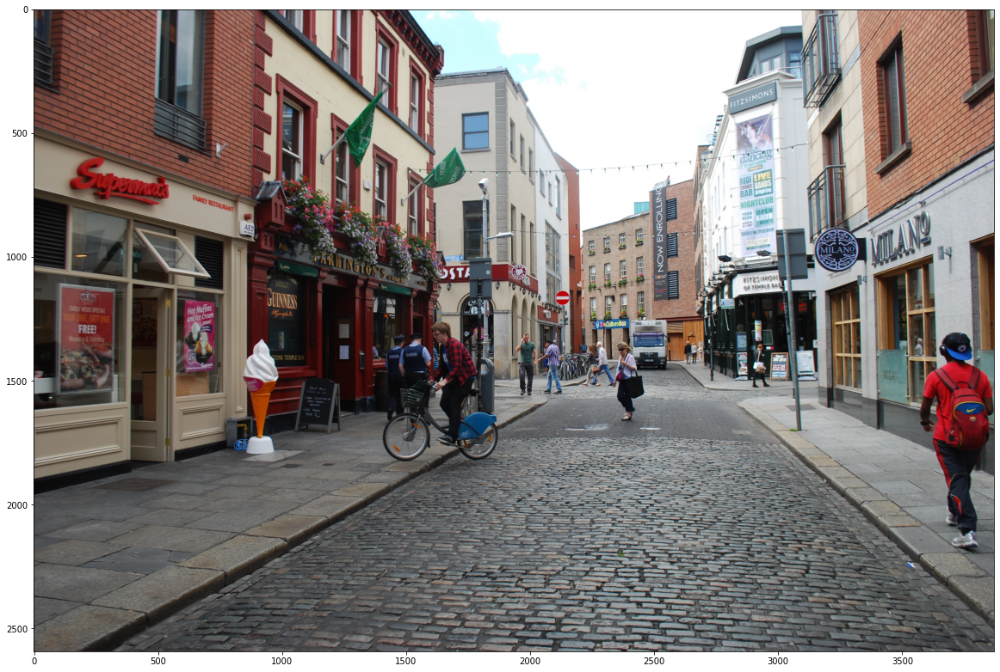

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

def display_image(image):
    """
    Displays an image inside the notebook.
    This is used by download_and_resize_image()
    """
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)
image_path = "/content/drive/MyDrive/DL/Comp_Vision/prac/20130807_dublin014.JPG"
pil_image = Image.open(image_path)
display_image(pil_image)

In [ ]:
np.array(pil_image).shape
np.expand_dims(np.array(pil_image), axis=0).shape

(1, 2592, 3872, 3)

In [ ]:
# running inference
image_np = np.expand_dims(np.array(pil_image), axis=0)
results = hub_model(image_np)

# different object detection models have additional results
# all of them are explained in the documentation
result = {key:value.numpy() for key,value in results.items()}
print(result.keys())

dict_keys(['rpn_features_to_crop', 'detection_anchor_indices', 'refined_box_encodings', 'mask_predictions', 'final_anchors', 'detection_classes', 'rpn_box_predictor_features', 'num_detections', 'class_predictions_with_background', 'raw_detection_boxes', 'proposal_boxes', 'rpn_box_encodings', 'box_classifier_features', 'raw_detection_scores', 'proposal_boxes_normalized', 'detection_multiclass_scores', 'num_proposals', 'anchors', 'detection_boxes', 'image_shape', 'rpn_objectness_predictions_with_background', 'detection_scores', 'detection_masks'])


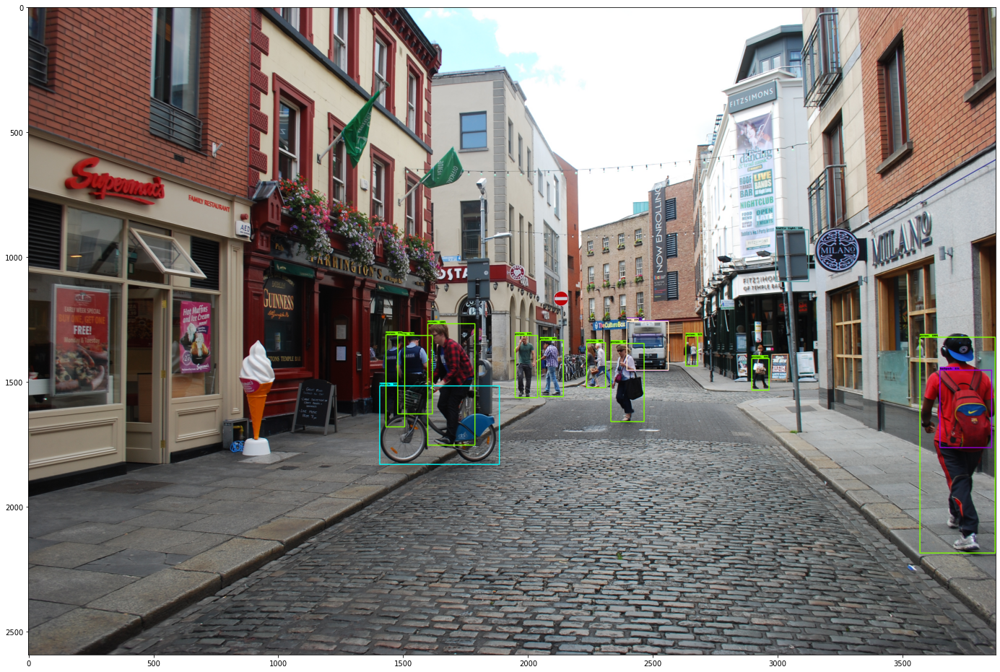

In [ ]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in result:
  keypoints = result['detection_keypoints'][0]
  keypoint_scores = result['detection_keypoint_scores'][0]

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores
      # ,keypoint_edges=COCO17_HUMAN_POSE_KEYPOINTS
      )

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()

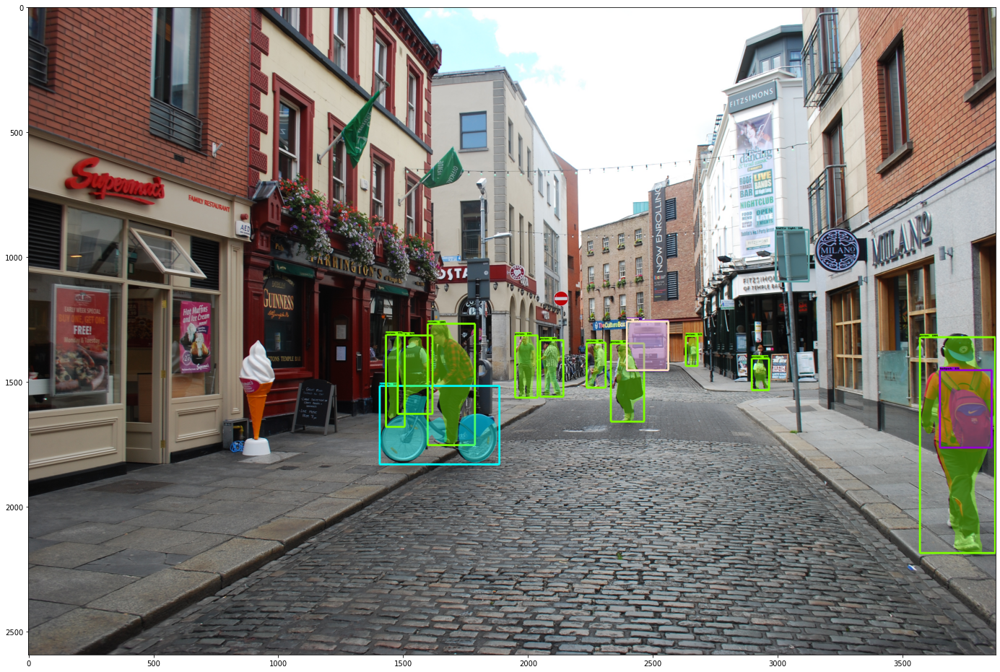

In [ ]:
# Handle models with masks:
image_np_with_mask = image_np.copy()

if 'detection_masks' in result:
  # we need to convert np.arrays to tensors
  detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
  detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])

  # Reframe the the bbox mask to the image size.
  detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes,
              image_np.shape[1], image_np.shape[2])
  detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                      tf.uint8)
  result['detection_masks_reframed'] = detection_masks_reframed.numpy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_mask[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      instance_masks=result.get('detection_masks_reframed', None),
      line_thickness=8)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_mask[0])
plt.show()

# Object Detection : Retraining checkpoint from model garden

In [3]:
%reset -f

In [4]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [5]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1606870 sha256=424456186158ec38a8b31694efcda4e752f7311fc86326aa31644df7e1c6865d
  Stored in directory: /tmp/pip-ephem-wheel-cache-qaigfn84/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
Successfully built object-detection
  Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [6]:
import numpy as np
import tensorflow as tf
print(tf.__version__)

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

2.4.0


In [7]:
from PIL import Image
from six import BytesIO

import matplotlib.pyplot as plt
%matplotlib inline
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)


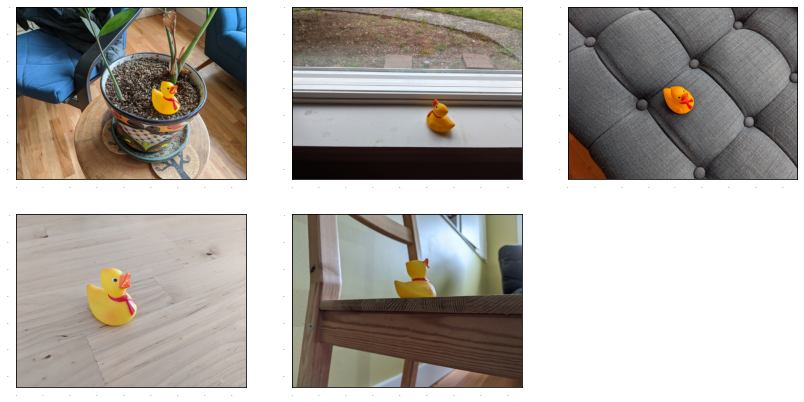

In [8]:
def display_images():
  plt.rcParams['axes.grid'] = False
  plt.rcParams['xtick.labelsize'] = False
  plt.rcParams['ytick.labelsize'] = False
  plt.rcParams['xtick.top'] = False
  plt.rcParams['xtick.bottom'] = False
  plt.rcParams['ytick.left'] = False
  plt.rcParams['ytick.right'] = False
  plt.rcParams['figure.figsize'] = [14, 7]

  for idx, train_image_np in enumerate(train_images_np):
    plt.subplot(2, 3, idx+1)
    plt.imshow(train_image_np)
  plt.show()

# Load images and visualize
import os
train_image_dir = 'models/research/object_detection/test_images/ducky/train/'
train_images_np = []
for i in range(1, 6):
  image_path = os.path.join(train_image_dir, 'robertducky' + str(i) + '.jpg')
  train_images_np.append(load_image_into_numpy_array(image_path))

display_images()


In [ ]:
# gt_boxes = []
# colab_utils.annotate(train_images_np, box_storage_pointer=gt_boxes)

In [9]:
# gt_boxes
gt_boxes = [
            np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),
            np.array([[0.539, 0.583, 0.73, 0.71]], dtype=np.float32),
            np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),
            np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),
            np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)
]

In [10]:
duck_class_id = 1
num_classes = 1

category_index = {duck_class_id: {'id': duck_class_id, 'name': 'rubber_ducky'}}

In [11]:
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []
for (train_image_np, gt_box_np) in zip(
    train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
      train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))
print('Done prepping data.')

Done prepping data.


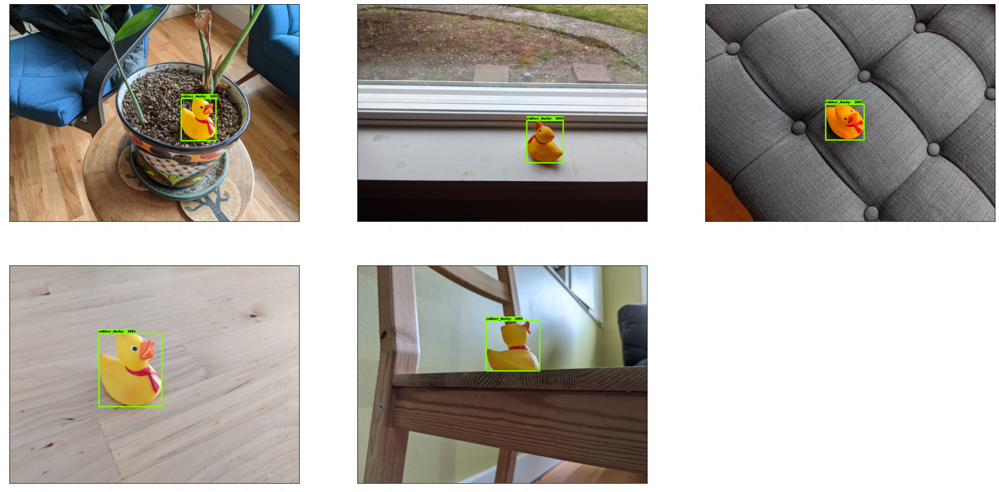

In [12]:
dummy_scores = np.array([1.0], dtype=np.float32)  # give boxes a score of 100%

plt.figure(figsize=(30, 15))
for idx in range(5):
  plt.subplot(2, 3, idx+1)
  plot_detections(
      train_images_np[idx],
      gt_boxes[idx],
      np.ones(shape=[gt_boxes[idx].shape[0]], dtype=np.int32),
      dummy_scores, category_index)
plt.show()

In [13]:
# Download the checkpoint and put it into models/research/object_detection/test_data/

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2020-12-29 16:55:27--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.218.128, 2a00:1450:4013:c08::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.218.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M  62.8MB/s    in 3.7s    

2020-12-29 16:55:31 (62.8 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



In [14]:
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)
num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new rubber ducky class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

# Set up object-based checkpoint restore --- RetinaNet has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Building model and restoring weights for fine-tuning...
Weights restored!


In [16]:
import random

tf.keras.backend.set_learning_phase(True)

# These parameters can be tuned; since our training set has 5 images
# it doesn't make sense to have a much larger batch size, though we could
# fit more examples in memory if we wanted to.
batch_size = 4
learning_rate = 0.01
num_batches = 100

# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Set up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  """Get a tf.function for training step."""

  # Use tf.function for a bit of speed.
  # Comment out the tf.function decorator if you want the inside of the
  # function to run eagerly.
  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    """A single training iteration.

    Args:
      image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
        Note that the height and width can vary across images, as they are
        reshaped within this function to be 640x640.
      groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
        tf.float32 representing groundtruth boxes for each image in the batch.
      groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
        with type tf.float32 representing groundtruth boxes for each image in
        the batch.

    Returns:
      A scalar tensor representing the total loss for the input batch.
    """
    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(
    detection_model, optimizer, to_fine_tune)

print('Start fine-tuning!', flush=True)
for idx in range(num_batches):
  # Grab keys for a random subset of examples
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  # Note that we do not do data augmentation in this demo.  If you want a
  # a fun exercise, we recommend experimenting with random horizontal flipping
  # and random cropping :)
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  if idx % 10 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches)
    + ', loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

Start fine-tuning!


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/backend.py:434: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


batch 0 of 100, loss=1.1273689
batch 10 of 100, loss=0.14962916
batch 20 of 100, loss=0.02074658
batch 30 of 100, loss=0.009745771
batch 40 of 100, loss=0.0054978384
batch 50 of 100, loss=0.0053876275
batch 60 of 100, loss=0.0035271246
batch 70 of 100, loss=0.0035226725
batch 80 of 100, loss=0.0030919614
batch 90 of 100, loss=0.002826216
Done fine-tuning!


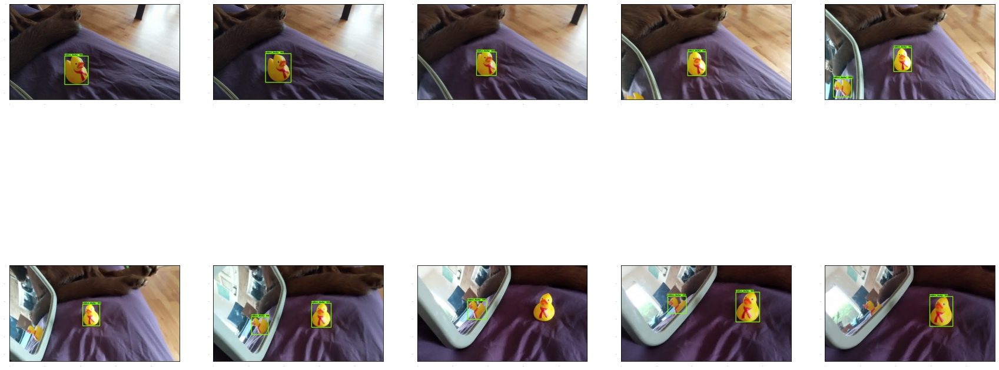

In [30]:
test_image_dir = 'models/research/object_detection/test_images/ducky/test/'
test_images_np = []
for i in range(1, 11):
  image_path = os.path.join(test_image_dir, 'out' + str(i*2) + '.jpg')
  test_images_np.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))

# Again, uncomment this decorator if you want to run inference eagerly
# @tf.function
def detect(input_tensor):
  """Run detection on an input image.

  Args:
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
plt.figure(figsize=(30, 15))
for i in range(10):
  plt.subplot(2, 5, i+1)
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)
  plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index
      # Comment this line if gif is not required
      # , figsize=(15, 20), image_name="gif_frame_" + ('%02d' % i) + ".jpg" 
      )
plt.show()


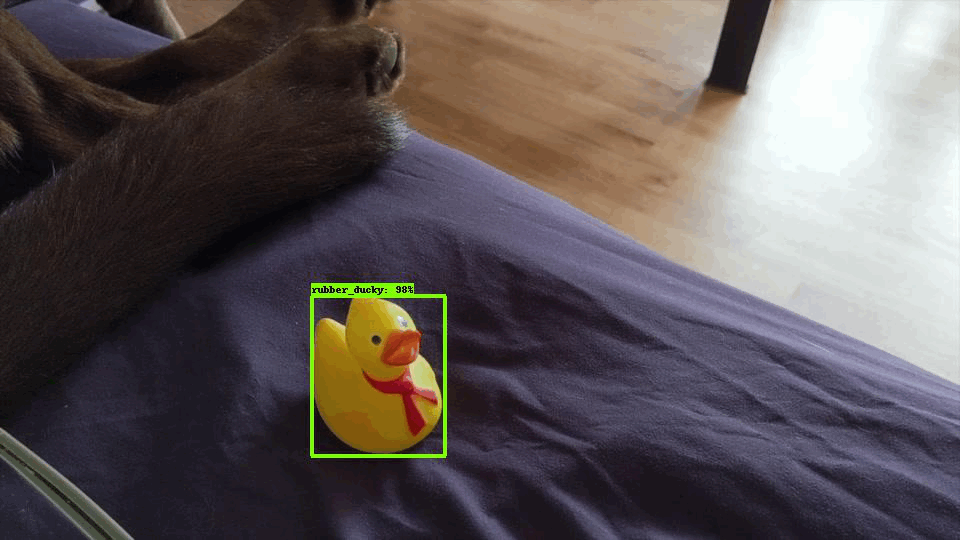

In [29]:
import io
import imageio
import glob
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

imageio.plugins.freeimage.download()

anim_file = 'duckies_test.gif'

filenames = glob.glob('gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
  image = imageio.imread(filename)
  images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)
display(IPyImage(open(anim_file, 'rb').read()))
